## Import & definitions

In [1]:
import os
import hashlib
import sys
from pathlib import Path
import re
import random
import time
import math
import itertools
from datetime import timedelta
from datetime import timezone
from datetime import datetime
import json
import joblib
# Third Party
import pickle
import pandas as pd
import numpy as np
from sklearn.metrics import precision_score, accuracy_score, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler
from sklearn.experimental import enable_halving_search_cv  # noqa: F401
from sklearn.model_selection import HalvingRandomSearchCV
from sklearn.model_selection import TimeSeriesSplit
from scipy.stats import randint
from scipy.stats import uniform
import scipy.stats as stats
from scipy.stats.mstats import mquantiles
import xgboost as xgb
# from helpers.ocean_helpers import save_list
'''import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
from keras.regularizers import L1L2'''
# PLOT
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
sns.set_theme()
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
#sns.set_theme("notebook")
#mpl.style.use('seaborn-v0_8-ticks')
# definitions
DT_PAST = 5 # 5 min
PAST_HISTORY = int(6*60 / DT_PAST) #  6 hours in 5mins units : used to predict next values in future
FUTURE_TARGET = 12 + 3 # number of 5 min to predict  : 15 : 1h15
STEP = 1
BATCH_SIZE = 256 #128 #32
TRAIN_SPLIT_RATIO = 0.9 #0.8 #0.9891 # 1-(60/5*24)/50977
TARGET_NAME = "Close_ETH"
MODE_TRAIN_AE = True 
'''
#LIST_SEEDS = [1,2,3,4,5]
LIST_SEEDS = [1]
MODE_AUTO_SELECT = 0 #1 #   #0 # 0: False, 1: True, 2: from disk
MODE_TRAIN_PREDICTOR = True # False

EPOCHS_AE = 1#30
PATIENCE_AE = 0#10
LIST_UNITS_ENC_AE = [64]
LIST_UNITS_AE = [16]
LIST_DROPOUT_AE = [0.2]

EPOCHS_PRED = 100#30
PATIENCE_PRED = 0#10
LIST_UNITS_PRED = [128]
LIST_DROPOUT_PRED = [0.2]

MODE_TRAIN_LSTM = False
'''
# paths
path_data = "data"
path_save_df_feat = os.path.join(path_data, "df_features_05m.csv")

path_save_pred_vals = os.path.join(path_data, "pred_vals.csv")
path_save_auto_select = os.path.join(path_data, "list_auto_select.csv")

path_scaler = os.path.join(path_data, "scaler.bin")
path_scaler_y = os.path.join(path_data, "scaler_y.bin")
path_scaler_enc = os.path.join(path_data, "scaler_enc.bin")
path_save_df_feat_std = os.path.join(path_data, "df_features_05m_std.csv")
path_X_train = os.path.join(path_data, 'X_train.dat')
path_X_train_sca = os.path.join(path_data, 'X_train_sca.dat')
path_df_prob_comb = os.path.join(path_data, 'df_prob_comb.csv')
path_df_prob_comb_2 = os.path.join(path_data, 'df_prob_comb_2.csv')
path_df_prob_comb_1b = os.path.join(path_data, 'df_prob_comb_1b.csv')
path_arr_corr_matrix_targets = os.path.join(
    path_data, 'arr_corr_matrix_targets.npy'
)
path_pca = os.path.join(path_data,"pca_model.pkl")
path_hash_pca = os.path.join(path_data, 'pca_hash.txt')

'''
path_mdl_autoencoder =  os.path.join(path_data, "mdl_autoencoder")
path_mdl_encoder  =  os.path.join(path_data, "mdl_encoder")
path_mdl_predict_lstm  =  os.path.join(path_data, "mdl_predict_lstm")
path_mdl_predict_autoenc_lstm  =  os.path.join(
    path_data, "mdl_predict_autoenc_lstm")
'''

'\npath_mdl_autoencoder =  os.path.join(path_data, "mdl_autoencoder")\npath_mdl_encoder  =  os.path.join(path_data, "mdl_encoder")\npath_mdl_predict_lstm  =  os.path.join(path_data, "mdl_predict_lstm")\npath_mdl_predict_autoenc_lstm  =  os.path.join(\n    path_data, "mdl_predict_autoenc_lstm")\n'

## Load 

In [2]:
# LOAD
df_prob_comb_high_event = pd.read_pickle(os.path.join(path_data, 'df_prob_comb_high_event.pkl'))
global_event_by_day = pd.read_pickle(os.path.join(path_data, 'global_event_by_day.pkl'))
df_combined_condition = pd.read_pickle(os.path.join(path_data, 'df_combined_condition.pkl'))
df_prob_comb_high_event_test = pd.read_pickle(os.path.join(path_data, 'df_prob_comb_high_event_test.pkl'))
global_event_by_day_test = pd.read_pickle(os.path.join(path_data, 'global_event_by_day_test.pkl'))
df_combined_condition_test = pd.read_pickle(os.path.join(path_data, 'df_combined_condition_test.pkl'))

df_targets = pd.read_pickle(os.path.join(path_data, "df_targets.pkl"))
df_targets_test = pd.read_pickle(os.path.join(path_data, "df_targets_test.pkl"))

with open(os.path.join(path_data, "list_df.pkl"), "rb") as f:
    list_df = pickle.load(f)

with open(os.path.join(path_data, "list_df_test.pkl"), "rb") as f:
    list_df_test = pickle.load(f)

In [3]:
# X train : df_combined_condition train
# X test: df_combined_condition_test

# Y train : high trade or not
y_comb = (list_df[0]["target_cat"] == "high")
# Y test 
y_comb_test = df_targets_test["target_cat"] == "high"

## Functions

In [4]:
# --- Define the new, simplified custom metric ---

def fun_nb_trade_fixed_window(y_true, y_pred):
    """
    Custom XGBoost metric to count 30-minute windows with at least one trade signal.
    Assumes each prediction corresponds to a 5-minute interval.
    
    Args:
        y_pred (np.ndarray): The array of predictions (0s and 1s).
        y_true (DMatrix): The DMatrix object with the true labels. We don't use it
                          for this specific metric, but it's part of the function signature.
    """
    window_size = 6  # 30 minutes / 5 minutes per data point

    # Calculate the number of full, non-overlapping windows we can form
    num_windows = len(y_pred) // window_size
    
    # If there are no full windows, the trade count is 0
    if num_windows == 0:
        return 0.0
    
    if y_pred.sum() == 0:
        return 0.0
    # Truncate y_pred to the largest size that is a multiple of window_size
    trunc_len = num_windows * window_size
    y_pred_truncated = y_pred[:trunc_len]

    # Reshape the predictions into a 2D array where each row is a 30-min window
    # The '-1' tells numpy to automatically calculate the number of rows
    pred_windows = y_pred_truncated.reshape(-1, window_size)

    # Sum the predictions in each window (each row)
    sum_in_windows = pred_windows.sum(axis=1)

    # Count how many windows have a sum of 1 or more (at least one trade signal)
    # The result of the boolean comparison is an array of True/False,
    # and .sum() counts the number of True values.
    total_trades = (sum_in_windows >= 1).sum()
    #precision_score(y_true, y_pred)
    # XGBoost custom metrics must return a list of (name, value) tuples
    return precision_score(y_true, y_pred) + 10*float(total_trades)


In [5]:
def fun_trade(total_trades, winrate, risk=250, R=1.23 ):
    return total_trades * risk * (winrate * (1 + R) - 1)

def fun_arr_trade(arr_trade, arr_winrate, risk=250, R=1.23):
    return arr_trade * risk * (arr_winrate * (1 + R) - 1)

def fun_trades_gain(y_true, y_pred):
    """
    Custom XGBoost metric to count 30-minute windows with at least one trade signal.
    Assumes each prediction corresponds to a 5-minute interval.
    
    Args:
        y_pred (np.ndarray): The array of predictions (0s and 1s).
        y_true (DMatrix): The DMatrix object with the true labels. We don't use it
                          for this specific metric, but it's part of the function signature.
    """
    risk = 250
    R = 1.23
    window_size = 6  # 30 minutes / 5 minutes per data point

    # Calculate the number of full, non-overlapping windows we can form
    num_windows = len(y_pred) // window_size
    
    # If there are no full windows, the trade count is 0
    if num_windows == 0:
        return 0.0
    if y_pred.sum() == 0:
        return 0.0
    
    # Truncate y_pred to the largest size that is a multiple of window_size
    trunc_len = num_windows * window_size
    y_pred_truncated = y_pred[:trunc_len]

    # Reshape the predictions into a 2D array where each row is a 30-min window
    # The '-1' tells numpy to automatically calculate the number of rows
    pred_windows = y_pred_truncated.reshape(-1, window_size)

    # Sum the predictions in each window (each row)
    sum_in_windows = pred_windows.sum(axis=1)

    # Count how many windows have a sum of 1 or more (at least one trade signal)
    # The result of the boolean comparison is an array of True/False,
    # and .sum() counts the number of True values.
    total_trades = (sum_in_windows >= 1).sum()
    #precision_score(y_true, y_pred)
    winrate = precision_score(y_true, y_pred)
    #total_gain = total_trades * risk * (winrate * (1 + R) - 1)
    total_gain = fun_trade(total_trades, winrate, risk, R )
    # XGBoost custom metrics must return a list of (name, value) tuples
    return total_gain #precision_score(y_true, y_pred) + 10*float(total_trades)


In [6]:
def fun_plot_trades_gain(arr_eval, arr_eval_train, title_str="XBGBoost model performance : total gain"):
    fig = make_subplots(
        rows=2, 
        cols=1, 
        shared_xaxes=True, 
        vertical_spacing=0.03
    )

    fig.add_trace(
        go.Scatter(y=arr_eval["fun_trades_gain"], name="total_gain test"),
        row=1,
        col=1,
    )
    fig.add_trace(
        go.Scatter(y=arr_eval_train["fun_trades_gain"], name="total_gain train"),
        row=1,
        col=1,
    )
    fig.update_layout(
        height=600,
        template="plotly_white",
        title=title_str,
        hovermode='x unified'
    )
    fig.update_xaxes(
        showspikes=True, 
        spikemode='across', 
        spikesnap='cursor',
        spikethickness=1,
        spikedash='dot'
    )

    # Optional: Add y-axis spikes for more context
    fig.update_yaxes(showspikes=True, spikedash='dot')

    fig.show()

In [7]:
def fun_decoded_nb_trade_fixed_window(arr_in):
    # arr_in = np.array(precision_score(y_true, y_pred) + 10*float(total_trades))
    return np.int64(arr_in/10), arr_in%10

def fun_winrate(nb_trade, gain=333, risk=250, R=1.23):
    return (gain / (nb_trade * risk)+1) /(1 + R)

def fun_arr_winrate(arr_nb_trade, gain=333, risk=250, R=1.23):
    return (gain / (arr_nb_trade * risk)+1) /(1 + R)


In [8]:
r_period_test = 1/ (y_comb_test.shape[0]/(30*288))
r_period_train = 1/ (y_comb.shape[0]/(30*288))

In [ ]:
# from CV : objective="binary:hinge", scoring="precision", min_resources=500,
# Best Score (Accuracy): 0.3451
#   colsample_bytree: 0.4145
#   learning_rate: 0.5959
#   max_depth: 2
#   reg_alpha: 0.0718
#   reg_lambda: 0.6826
#   subsample: 0.4177
best_params_= {}
best_params_["colsample_bytree"] = 0.4145
best_params_["learning_rate"] = 0.5959
best_params_["max_depth"] = 2
best_params_["reg_alpha"] = 0.0718
best_params_["reg_lambda"] = 0.6826
best_params_["subsample"] = 0.4177


## XGBoost

### Search n estimators to converge

Model trained.
Accuracy on training data: 0.7574947424940713
Accuracy on test data: 0.7173956931359354
For Model XGBoost: 
precision TRAIN: 0.603
% possible trades : 1.42
nb trade per day : 4.10
precision TEST: 0.344
% possible trades : 0.95
nb trade per day : 2.73


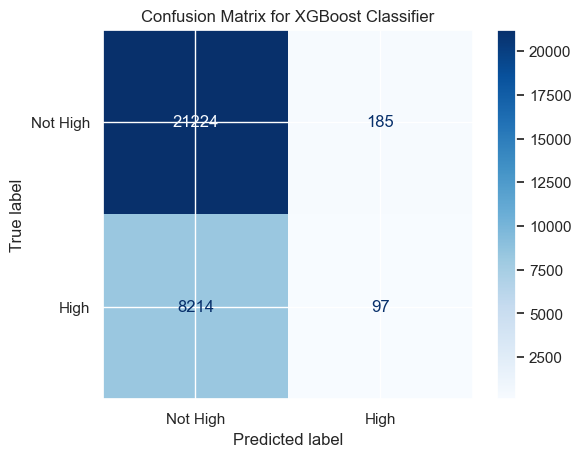

In [ ]:
mode_redo_0 = False
if mode_redo_0:
    # n 100 : 14.875
    xgb_mdl = xgb.XGBClassifier(
        verbosity=0,
        objective="binary:hinge",
        random_state=42,
        n_jobs=-1,
        #use_label_encoder=False, # Recommended to avoid a future warning
        eval_metric=fun_nb_trade_fixed_window, #fun_trades_gain, #[fun_nb_trade_fixed_window, precision_score], #, # A common metric for binary classification
        max_depth=best_params_["max_depth"],
        learning_rate=best_params_["learning_rate"],
        subsample=best_params_["subsample"],
        colsample_bytree=best_params_["colsample_bytree"],
        reg_alpha=best_params_["reg_alpha"],
        reg_lambda=best_params_["reg_lambda"],
        #scale_pos_weight=1.5,  # ajuster si classes déséquilibrées
        n_estimators=10000,#400+59+1,
    )
    xgb_mdl.fit(
        df_combined_condition, 
        y_comb, 
        eval_set=[(df_combined_condition_test, y_comb_test), (df_combined_condition, y_comb)],
        verbose=0,
    )
    print("Model trained.")
    # save xgb_mdl
    with open(os.path.join(path_data,'xgb_mdl_00.pkl'), 'wb') as f:
        pickle.dump(xgb_mdl, f)
else:
    # load  xgb_mdl
    xgb_mdl = pickle.load(open(os.path.join(path_data,'xgb_mdl_00.pkl'), 'rb'))
    print("Model loaded.")

print("Accuracy on training data:", xgb_mdl.score(df_combined_condition, y_comb))
print("Accuracy on test data:", xgb_mdl.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = xgb_mdl.predict(df_combined_condition)
arr_xgb_pred = xgb_mdl.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

In [11]:
arr_eval = xgb_mdl.evals_result_["validation_0"]
arr_eval_train = xgb_mdl.evals_result_["validation_1"]
arr_eval_nb_trade, arr_eval_precision = fun_decoded_nb_trade_fixed_window(np.array(arr_eval["fun_nb_trade_fixed_window"]))
arr_eval_nb_trade_train, arr_eval_precision_train = fun_decoded_nb_trade_fixed_window(
    np.array(arr_eval_train["fun_nb_trade_fixed_window"])
)
arr_eval_gain = fun_arr_trade(arr_eval_nb_trade, arr_eval_precision, risk=250, R=1.23)
arr_eval_gain_train = fun_arr_trade(arr_eval_nb_trade_train, arr_eval_precision_train, risk=250, R=1.23)

df = pd.DataFrame({
    'trades_train': arr_eval_nb_trade_train*r_period_train,
    'precision_train': arr_eval_precision_train,
    'gain_train': arr_eval_gain_train*r_period_train,
    'trades_test': arr_eval_nb_trade*r_period_test,
    'precision_test': arr_eval_precision,
    'gain_test': arr_eval_gain*r_period_test,
})
# The index is automatically available, but we can add it as a column if we want to name it.
df['run_index'] = df.index

df

,trades_train,precision_train,gain_train,trades_test,precision_test,gain_test,run_index
0,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,0
1,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,1
2,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,2
3,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,3
4,0.515459,0.545455,27.881793,0.000000,0.000000,-0.000000,4
...,...,...,...,...,...,...,...
9995,75.128194,0.570174,5099.101135,61.340511,0.350588,-3345.952532,9995
9996,59.599982,0.600885,5065.604374,44.769852,0.344371,-2597.240920,9996
9997,89.561054,0.545597,4851.551637,81.399731,0.349233,-4501.616957,9997
9998,67.170791,0.587655,5213.639758,51.746972,0.338889,-3160.155610,9998


In [12]:
df[df["gain_test"] == df["gain_test"].max()]

,trades_train,precision_train,gain_train,trades_test,precision_test,gain_test,run_index
63,15.818157,0.367604,-712.778353,22.094213,0.512048,783.610137,63


In [13]:
df.sort_values(by=['trades_train'], ascending=False)

,trades_train,precision_train,gain_train,trades_test,precision_test,gain_test,run_index
9049,95.746566,0.512924,3442.580222,86.923284,0.334828,-5505.146245,9049
9272,94.908944,0.523725,3983.963103,79.074024,0.327181,-5345.134593,9272
9044,94.844512,0.518291,3693.931263,83.144011,0.334891,-5262.871835,9044
9428,94.264620,0.511136,3295.332763,100.296097,0.338942,-6122.057206,9428
5814,94.071323,0.505939,3016.019984,71.224764,0.294559,-6109.899433,5814
...,...,...,...,...,...,...,...
1,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,1
5,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,5
3,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,3
2,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,2


In [34]:
def fun_plot_pre_trade(df, gain_period_min = 333, gain_period_bingo = 1000):
    
    arr_nb_trade_winrate_train = np.linspace(0.5, max(df["trades_train"]), 100)
    arr_winrate_min_train = fun_arr_winrate(arr_nb_trade_winrate_train, gain=gain_period_min, risk=250, R=1.23)
    
    arr_winrate_bingo_train = fun_arr_winrate(arr_nb_trade_winrate_train, gain=gain_period_bingo, risk=250, R=1.23)

    # --- 3. Create the Plot with Custom Hover Data ---
    # We now pass column names (as strings) to plotly.express.
    fig = px.scatter(
        df,  # Pass the entire DataFrame as the first argument
        x='trades_test',
        y='precision_test',
        title="Evaluation Precision vs. Number of Trades",
        color_discrete_sequence=["#3CB620"],
        #hover_data=df[['run_index', 'gain_test', 'gain_train']],
    )
    # Customize the hover template for a cleaner look (Optional but recommended)
    fig.update_traces(
            hovertemplate="Run Index: %{customdata[0]}<br>" +
                "Gain Train: %{customdata[1]:.2f}<br>" +
                "Trades Train: %{customdata[3]:.2f}<br>" +
                "Winrate Train: %{customdata[4]:.4f}<br>" +
                "<b>Gain Test: %{customdata[2]:.2f}</b><br>" +
                "Trades Test: %{x:.2f}<br>" +
                "Winrate Train: %{y:.4f}<br>" +
                    "<extra></extra>", # <extra></extra> hides the secondary box
            customdata=df[['run_index', 'gain_train', "gain_test", "trades_train", "precision_train"]],
    )

    # add precision = f(nb_trade) to have a gain = 333/mth
    fig.add_scatter(
        x=arr_nb_trade_winrate_train,
        y=arr_winrate_min_train,
        mode='lines',
        line=dict(color='red', width=2),
        line_dash="dash",
        name="333$/mth Precision",
        hovertemplate=f"Gain: {gain_period_min:.2f}<br>" +
                    "Number of Trades: %{x}<br>" +
                    "Precision: %{y:.4f}<br>" +
                    "<extra></extra>", # <extra></extra> hides the secondary box
    )
    # add precision = f(nb_trade) to have a gain = 1000/mth
    fig.add_scatter(
        x=arr_nb_trade_winrate_train,
        y=arr_winrate_bingo_train,
        mode='lines',
        line=dict(color='blue', width=2),
        line_dash="dash",
        name="1000$/mth Precision",
        hovertemplate=f"Gain: {gain_period_bingo:.2f}<br>" +
                    "Number of Trades: %{x}<br>" +
                    "Precision: %{y:.4f}<br>" +
                    "<extra></extra>", # <extra></extra> hides the secondary box
    )
    # add train
    fig.add_trace(
        go.Scatter(
            x=df["trades_train"],
            y=df["precision_train"],
            name="train",
            mode="markers",
            hovertemplate="Run Index: %{customdata[0]}<br>" +
                "<b>Gain Train: %{customdata[1]:.2f}</b><br>" +
                "Trades Train: %{x:.2f}<br>" +
                "Winrate Train: %{y:.4f}<br>" +
                "Gain Test: %{customdata[2]:.2f}<br>" +
                "Trades Test: %{customdata[3]:.2f}<br>" +
                "Winrate Train: %{customdata[4]:.4f}<br>" +
                    "<extra></extra>", # <extra></extra> hides the secondary box
            customdata=df[['run_index', 'gain_train', "gain_test", "trades_test", "precision_test"]],
        )
    )

    fig.update_layout(
        xaxis_title="Number of Trades / mth",
        yaxis_title="Precision",
        font=dict(family="Arial, sans-serif", size=14),
        height=600,
    )

    fig.show()
fun_plot_pre_trade(df)

In [40]:
def fun_plot_xgb_rounds(df, gain_period_min = 333, gain_period_bingo = 1000):
    
    layout = dict(
        hoversubplots="axis",
        title=dict(text="XBGBoost model performance"),
        hovermode="x",
        grid=dict(rows=3, columns=1),
        height=600,
        xaxis_title="XGB Rounds",
            yaxis=dict(
            title="Trades"
        ),
        yaxis2=dict(
            title="Precision"
        ),
        yaxis3=dict(
            title="Gain"
        )
    )

    data = [
        go.Scatter(x=df["run_index"], y=df["trades_train"], xaxis="x", yaxis="y", name="trades train", mode="markers"), #marker=dict(color="blue")),
        go.Scatter(x=df["run_index"], y=df["trades_test"], xaxis="x", yaxis="y", name="trades test",  mode="markers"), #marker=dict(color="red")),
        go.Scatter(x=df["run_index"], y=df["precision_train"], xaxis="x", yaxis="y2", name="pre train",  mode="markers"), # marker=dict(color="blue")),
        go.Scatter(x=df["run_index"], y=df["precision_test"], xaxis="x", yaxis="y2", name="pre test",  mode="markers"), #marker=dict(color="red")),
        go.Scatter(x=df["run_index"], y=df["gain_train"], xaxis="x", yaxis="y3", name="gain train",  mode="markers"), #marker=dict(color="blue")),
        go.Scatter(x=df["run_index"], y=df["gain_test"], xaxis="x", yaxis="y3", name="gain test",  mode="markers"), #marker=dict(color="red")),
    ]

    fig = go.Figure(data=data, layout=layout)

    fig.add_hline(
        y=gain_period_min,
        xref="x", 
        yref="y3",
        line_dash="dot",
        line=dict(color='red', width=2),
        annotation_text=f"Gain: {gain_period_min:.2f}$/mth",
        annotation_position="bottom right",
        annotation_font_color="red",
        annotation_font_size=8,
        row=3, 
        col=1,
    )
    fig.add_hline(
        y=gain_period_bingo,
        xref="x", 
        yref="y3",
        line_dash="dot",
        annotation_text=f"Gain: {gain_period_bingo:.2f}$/mth",
        annotation_position="top right",
        annotation_font_color="blue",
        annotation_font_size=8,
        row=3, 
        col=1,
    )
    fig.update_xaxes(
        showspikes=True, 
        spikemode='across', 
        spikesnap='cursor',
        spikethickness=1,
        spikedash='dot',
    )
    fig.show()
fun_plot_xgb_rounds(df)

### CV scoring average_precision

In [42]:
mode_redo = False

In [ ]:
if mode_redo:
    # --- 3. Define the Base Model ---
    # Note: 'n_estimators' is controlled by the search, so we don't set it here.
    # 'early_stopping_rounds' is not used directly with HalvingRandomSearchCV.
    xgb_mdl = xgb.XGBClassifier(
        objective="binary:hinge",
        random_state=42,
        #use_label_encoder=False, # Recommended to avoid a future warning
        #eval_metric=fun_nb_trade_fixed_window, # A common metric for binary classification
        n_estimators=1000,
    )

    # --- 4. Define the Hyperparameter Search Space ---
    param_dist = {
        'max_depth': randint(1, 4),             # Search depths from 2 to 4
        'learning_rate': uniform(0.01, 1),   # Search from 0.05 up to 0.6
        'subsample': uniform(0.2, 0.9),         # Search between 0.4 and 0.9
        'colsample_bytree': uniform(0.1, 0.7),  # Search between 0.1 and 0.6
        'reg_alpha': uniform(0.0, 1),         # Search L1 regularization
        'reg_lambda': uniform(0.0, 1),        # Search L2 regularization
        #'scale_pos_weight': uniform(1, 3),  # ajuster si classes déséquilibrées
    }

    tscv = TimeSeriesSplit(n_splits=5)

    # --- 5. Set up and Run HalvingRandomSearchCV ---
    halving_search = HalvingRandomSearchCV(
        n_jobs=-1,                # Use all available CPU cores
        random_state=42,
        verbose=1,                # Set to 1 or 2 to see the progress
        cv=tscv,
        factor=2,  # Keep the top 1/3 of candidates in each iteration
        estimator=xgb_mdl,
        param_distributions=param_dist,
        #max_resources=150,        # The maximum n_estimators to use for the final model
        min_resources=250,         # The initial n_samples to start with
        scoring='average_precision',       # Metric for evaluation, since hinge loss gives 0/1
    )

    print("Starting HalvingRandomSearchCV...")
    # Fit the model to the data
    halving_search.fit(df_combined_condition, y_comb)
    print("\nSearch complete!")

    # --- 6. Display the Results ---
    print("\n--- Cross-Validation Results ---")
    print(f"Best Score (Accuracy): {halving_search.best_score_:.4f}")
    print("\nBest Parameters Found:")
    # Using a loop for cleaner printing
    for param, value in halving_search.best_params_.items():
        if isinstance(value, float):
            print(f"  {param}: {value:.4f}")
        else:
            print(f"  {param}: {value}")
    # save halving_search
    with open(os.path.join(path_data,'xgb_halving_search_01.pkl'), 'wb') as f:
        pickle.dump(halving_search, f)
else:
    # load  halving_search
    halving_search = pickle.load(open(os.path.join(path_data,'xgb_halving_search_01.pkl'), 'rb'))

# The best_estimator_ is a fully trained model on the entire dataset
# using the best parameters found.
best_model = halving_search.best_estimator_
print("\nBest model is now trained and ready to be used for predictions.")
halving_search.best_params_


Best model is now trained and ready to be used for predictions.


{'colsample_bytree': np.float64(0.3816843815095182),
 'learning_rate': np.float64(0.8945868882296137),
 'max_depth': 3,
 'reg_alpha': np.float64(0.29507234926430936),
 'reg_lambda': np.float64(0.2988571352590308),
 'subsample': np.float64(0.2963514606987675)}

In [44]:
best_model

,objective,'binary:hinge'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,np.float64(0.3816843815095182)
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


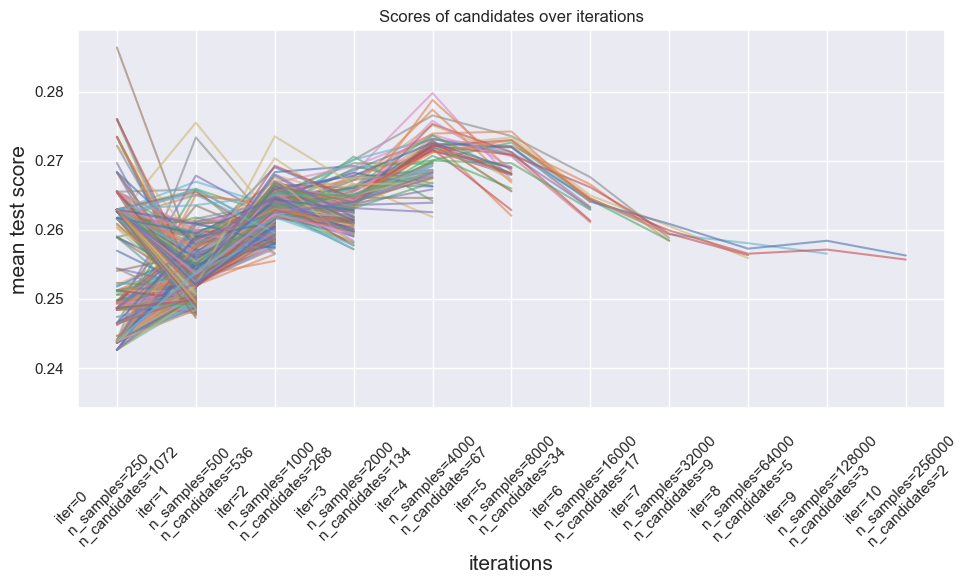

In [ ]:
# --- Cross-Validation Results ---

# Best Parameters Found:
# {'colsample_bytree': np.float64(0.3816843815095182),
#  'learning_rate': np.float64(0.8945868882296137),
#  'max_depth': 3,
#  'reg_alpha': np.float64(0.29507234926430936),
#  'reg_lambda': np.float64(0.2988571352590308),
#  'subsample': np.float64(0.2963514606987675)}


results = pd.DataFrame(halving_search.cv_results_)
results["params_str"] = results.params.apply(str)
results.drop_duplicates(subset=("params_str", "iter"), inplace=True)
mean_scores = results.pivot(
    index="iter", columns="params_str", values="mean_test_score"
)
ax = mean_scores.plot(legend=False, alpha=0.6)

labels = [
    f"iter={i}\nn_samples={halving_search.n_resources_[i]}\nn_candidates={halving_search.n_candidates_[i]}"
    for i in range(halving_search.n_iterations_)
]

ax.set_xticks(range(halving_search.n_iterations_))
ax.set_xticklabels(labels, rotation=45, multialignment="left")
ax.set_title("Scores of candidates over iterations")
ax.set_ylabel("mean test score", fontsize=15)
ax.set_xlabel("iterations", fontsize=15)
plt.gcf().set_size_inches((10, 6))
plt.tight_layout()
plt.show()

Model trained.
Accuracy on training data: 0.7546534520560204
Accuracy on test data: 0.7116756393001346
For Model XGBoost: 
precision TRAIN: 0.502
% possible trades : 3.40
nb trade per day : 9.78
precision TEST: 0.353
% possible trades : 2.96
nb trade per day : 8.53


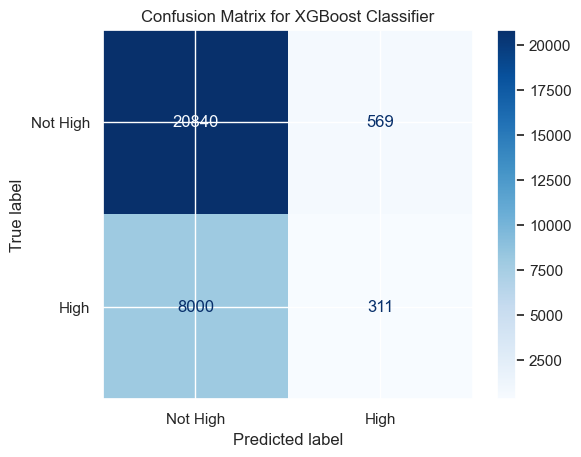

In [46]:
print("Model trained.")
print("Accuracy on training data:", best_model.score(df_combined_condition, y_comb))
print("Accuracy on test data:", best_model.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = best_model.predict(df_combined_condition)
arr_xgb_pred = best_model.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

In [57]:
halving_search.best_params_

{'colsample_bytree': np.float64(0.3816843815095182),
 'learning_rate': np.float64(0.8945868882296137),
 'max_depth': 3,
 'reg_alpha': np.float64(0.29507234926430936),
 'reg_lambda': np.float64(0.2988571352590308),
 'subsample': np.float64(0.2963514606987675)}

In [ ]:
mode_redo = False

Model trained.
Accuracy on training data: 0.7610258475397855
Accuracy on test data: 0.7068977119784656
For Model XGBoost: 
precision TRAIN: 0.576
% possible trades : 4.26
nb trade per day : 12.27
precision TEST: 0.313
% possible trades : 3.59
nb trade per day : 10.35


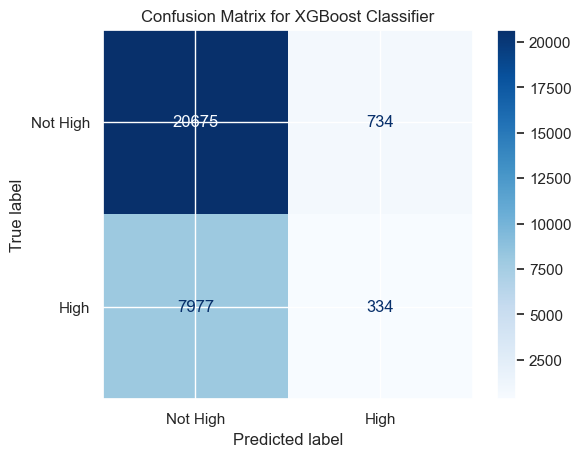

In [59]:
#   colsample_bytree: 0.4829
#   learning_rate: 0.8398
#   max_depth: 3
#   reg_alpha: 0.7804
#   reg_lambda: 0.4580
#   scale_pos_weight: 2.1940
#   subsample: 0.4726
if mode_redo:
    # n 100 : 14.875
    xgb_mdl = xgb.XGBClassifier(
        verbosity=0,
        objective="binary:hinge",
        random_state=42,
        n_jobs=-1,
        #use_label_encoder=False, # Recommended to avoid a future warning
        eval_metric=fun_nb_trade_fixed_window, #fun_trades_gain, #[fun_nb_trade_fixed_window, precision_score], #, # A common metric for binary classification
        max_depth=halving_search.best_params_["max_depth"],
        learning_rate=halving_search.best_params_["learning_rate"],
        subsample=halving_search.best_params_["subsample"],
        colsample_bytree=halving_search.best_params_["colsample_bytree"],
        reg_alpha=halving_search.best_params_["reg_alpha"],
        reg_lambda=halving_search.best_params_["reg_lambda"],
        #scale_pos_weight=1.5,  # ajuster si classes déséquilibrées
        n_estimators=10000,#400+59+1,
    )
    xgb_mdl.fit(
        df_combined_condition, 
        y_comb, 
        eval_set=[(df_combined_condition_test, y_comb_test), (df_combined_condition, y_comb)],
        verbose=0,
    )
    print("Model trained.")
    # save xgb_mdl
    with open(os.path.join(path_data,'xgb_mdl_01.pkl'), 'wb') as f:
        pickle.dump(xgb_mdl, f)
else:
    # load  xgb_mdl
    xgb_mdl = pickle.load(open(os.path.join(path_data,'xgb_mdl_01.pkl'), 'rb'))
    print("Model loaded.")

print("Accuracy on training data:", xgb_mdl.score(df_combined_condition, y_comb))
print("Accuracy on test data:", xgb_mdl.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = xgb_mdl.predict(df_combined_condition)
arr_xgb_pred = xgb_mdl.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

In [60]:
arr_eval = xgb_mdl.evals_result_["validation_0"]
arr_eval_train = xgb_mdl.evals_result_["validation_1"]
arr_eval_nb_trade, arr_eval_precision = fun_decoded_nb_trade_fixed_window(np.array(arr_eval["fun_nb_trade_fixed_window"]))
arr_eval_nb_trade_train, arr_eval_precision_train = fun_decoded_nb_trade_fixed_window(
    np.array(arr_eval_train["fun_nb_trade_fixed_window"])
)
arr_eval_gain = fun_arr_trade(arr_eval_nb_trade, arr_eval_precision, risk=250, R=1.23)
arr_eval_gain_train = fun_arr_trade(arr_eval_nb_trade_train, arr_eval_precision_train, risk=250, R=1.23)

df = pd.DataFrame({
    'trades_train': arr_eval_nb_trade_train*r_period_train,
    'precision_train': arr_eval_precision_train,
    'gain_train': arr_eval_gain_train*r_period_train,
    'trades_test': arr_eval_nb_trade*r_period_test,
    'precision_test': arr_eval_precision,
    'gain_test': arr_eval_gain*r_period_test,
})
# The index is automatically available, but we can add it as a column if we want to name it.
df['run_index'] = df.index

df

,trades_train,precision_train,gain_train,trades_test,precision_test,gain_test,run_index
0,4.155891,0.412646,-82.909416,0.000000,0.000000,-0.000000,0
1,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,1
2,0.837621,0.565217,54.536252,0.000000,0.000000,-0.000000,2
3,10.631348,0.432398,-95.024212,7.849260,0.166667,-1232.986428,3
4,7.989619,0.396199,-232.650182,2.034993,0.421053,-31.060006,4
...,...,...,...,...,...,...,...
9995,123.839098,0.622815,12039.558155,104.947510,0.308564,-8183.341920,9995
9996,169.843841,0.539023,8578.017958,161.927322,0.332114,-10500.411159,9996
9997,135.018122,0.600675,11459.840284,117.448183,0.311185,-8986.472852,9997
9998,114.560830,0.636928,12038.895233,95.644684,0.312588,-7243.381360,9998


In [61]:
fun_plot_pre_trade(df)

In [62]:
fun_plot_xgb_rounds(df)

### CV scoring precision

In [ ]:
mode_redo = False

In [63]:
# --- Cross-Validation Results ---
# Best Score (Accuracy): 0.3672

# Best Parameters Found:
#   colsample_bytree: 0.6269
#   learning_rate: 0.1686
#   max_depth: 3
#   reg_alpha: 0.9613
#   reg_lambda: 0.4655
#   scale_pos_weight: 3.6372
#   subsample: 0.2046
if mode_redo:
    # --- 3. Define the Base Model ---
    # Note: 'n_estimators' is controlled by the search, so we don't set it here.
    # 'early_stopping_rounds' is not used directly with HalvingRandomSearchCV.
    xgb_mdl = xgb.XGBClassifier(
        objective="binary:hinge",
        random_state=42,
        #use_label_encoder=False, # Recommended to avoid a future warning
        #eval_metric=fun_nb_trade_fixed_window, # A common metric for binary classification
        n_estimators=1000,
    )

    # --- 4. Define the Hyperparameter Search Space ---
    param_dist = {
        'max_depth': randint(1, 4),             # Search depths from 2 to 4
        'learning_rate': uniform(0.01, 1),   # Search from 0.05 up to 0.6
        'subsample': uniform(0.2, 0.9),         # Search between 0.4 and 0.9
        'colsample_bytree': uniform(0.1, 0.7),  # Search between 0.1 and 0.6
        'reg_alpha': uniform(0.0, 1),         # Search L1 regularization
        'reg_lambda': uniform(0.0, 1),        # Search L2 regularization
        #'scale_pos_weight': uniform(1, 3),  # ajuster si classes déséquilibrées
    }

    tscv = TimeSeriesSplit(n_splits=5)

    # --- 5. Set up and Run HalvingRandomSearchCV ---
    halving_search_2 = HalvingRandomSearchCV(
        n_jobs=-1,                # Use all available CPU cores
        random_state=42,
        verbose=1,                # Set to 1 or 2 to see the progress
        cv=tscv,
        factor=2,  # Keep the top 1/3 of candidates in each iteration
        estimator=xgb_mdl,
        param_distributions=param_dist,
        #max_resources=150,        # The maximum n samples to use for the final model
        min_resources=250,         # The initial n_samples to start with
        scoring='precision',       # Metric for evaluation, since hinge loss gives 0/1
    )

    print("Starting HalvingRandomSearchCV...")
    # Fit the model to the data
    halving_search_2.fit(df_combined_condition, y_comb)
    print("\nSearch complete!")

    # --- 6. Display the Results ---
    print("\n--- Cross-Validation Results ---")
    print(f"Best Score (Accuracy): {halving_search_2.best_score_:.4f}")
    print("\nBest Parameters Found:")
    # Using a loop for cleaner printing
    for param, value in halving_search_2.best_params_.items():
        if isinstance(value, float):
            print(f"  {param}: {value:.4f}")
        else:
            print(f"  {param}: {value}")
    # save halving_search
    with open(os.path.join(path_data,'xgb_halving_search_02.pkl'), 'wb') as f:
        pickle.dump(halving_search_2, f)
else:
    # load  halving_search
    halving_search_2 = pickle.load(open(os.path.join(path_data,'xgb_halving_search_02.pkl'), 'rb'))
# The best_estimator_ is a fully trained model on the entire dataset
# using the best parameters found.
best_model_2 = halving_search_2.best_estimator_
print("\nBest model is now trained and ready to be used for predictions.")

Starting HalvingRandomSearchCV...
n_iterations: 11
n_required_iterations: 11
n_possible_iterations: 11
min_resources_: 250
max_resources_: 268188
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 1072
n_resources: 250
Fitting 5 folds for each of 1072 candidates, totalling 5360 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capital

----------
iter: 1
n_candidates: 536
n_resources: 500
Fitting 5 folds for each of 536 candidates, totalling 2680 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capital

----------
iter: 2
n_candidates: 268
n_resources: 1000
Fitting 5 folds for each of 268 candidates, totalling 1340 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [0.2        0.         0.         ... 0.268      0.24780952 0.29285714]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1.         1.         1.         ... 0.96605769 0.95375    0.95375   ]



----------
iter: 3
n_candidates: 134
n_resources: 2000
Fitting 5 folds for each of 134 candidates, totalling 670 fits
----------
iter: 4
n_candidates: 67
n_resources: 4000
Fitting 5 folds for each of 67 candidates, totalling 335 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [0.2        0.         0.         ... 0.33244947 0.30734892 0.33766596]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1.         1.         1.         ... 0.96530681 0.91611114 0.91976292]



----------
iter: 5
n_candidates: 34
n_resources: 8000
Fitting 5 folds for each of 34 candidates, totalling 170 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [0.2        0.         0.         ... 0.36331263 0.39440602 0.39033544]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1.         1.         1.         ... 0.9296232  0.8823422  0.88506439]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


----------
iter: 6
n_candidates: 17
n_resources: 16000
Fitting 5 folds for each of 17 candidates, totalling 85 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [0.2        0.         0.         ... 0.12933333 0.35361019 0.36988844]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1.         1.         1.         ... 0.91125541 0.87969678 0.86225898]



----------
iter: 7
n_candidates: 9
n_resources: 32000
Fitting 5 folds for each of 9 candidates, totalling 45 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [0.2        0.         0.         ... 0.27750604 0.36703947 0.32155296]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1.         1.         1.         ... 0.77617826 0.72792422 0.70439674]



----------
iter: 8
n_candidates: 5
n_resources: 64000
Fitting 5 folds for each of 5 candidates, totalling 25 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [0.2        0.         0.         ... 0.34084743 0.32946555 0.29649718]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1.         1.         1.         ... 0.56846362 0.67937789 0.69597712]



----------
iter: 9
n_candidates: 3
n_resources: 128000
Fitting 5 folds for each of 3 candidates, totalling 15 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [0.2        0.         0.         ... 0.33709976 0.30429832 0.30366179]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1.         1.         1.         ... 0.60377502 0.49630733 0.63903706]



----------
iter: 10
n_candidates: 2
n_resources: 256000
Fitting 5 folds for each of 2 candidates, totalling 10 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [0.2        0.         0.         ... 0.33712695 0.31694643 0.32940714]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1.         1.         1.         ... 0.5562305  0.4295818  0.55127941]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [0.2        0.         0.         ... 0.32940714 0.32704547 0.34181462]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1.         1.         1.         ... 0.55127941 0.57904677 0.55761588]




Search complete!

--- Cross-Validation Results ---
Best Score (Accuracy): 0.3418

Best Parameters Found:
  colsample_bytree: 0.1218
  learning_rate: 0.7493
  max_depth: 2
  reg_alpha: 0.3251
  reg_lambda: 0.6863
  subsample: 0.2627

Best model is now trained and ready to be used for predictions.


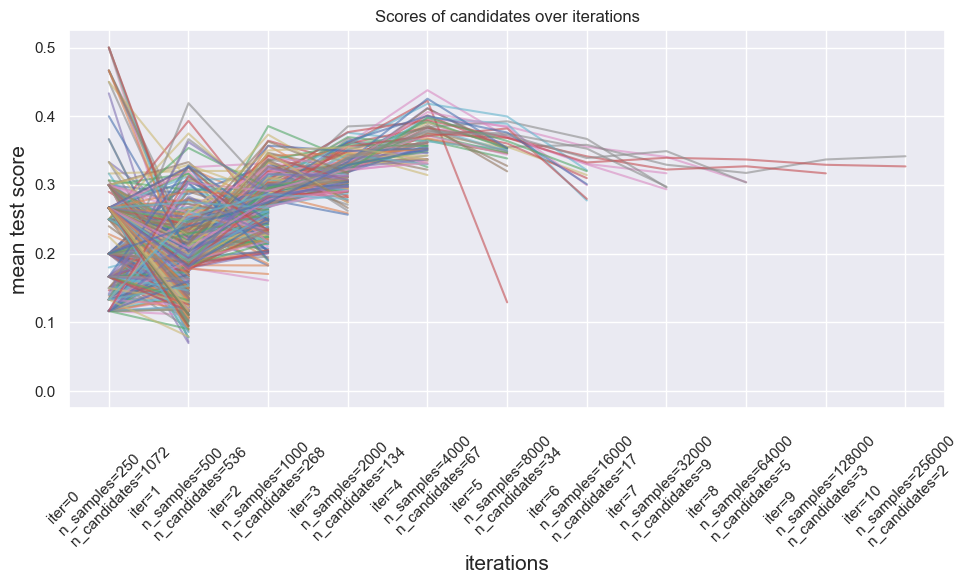

In [64]:
results = pd.DataFrame(halving_search_2.cv_results_)
results["params_str"] = results.params.apply(str)
results.drop_duplicates(subset=("params_str", "iter"), inplace=True)
mean_scores = results.pivot(
    index="iter", columns="params_str", values="mean_test_score"
)
ax = mean_scores.plot(legend=False, alpha=0.6)

labels = [
    f"iter={i}\nn_samples={halving_search_2.n_resources_[i]}\nn_candidates={halving_search_2.n_candidates_[i]}"
    for i in range(halving_search_2.n_iterations_)
]

ax.set_xticks(range(halving_search_2.n_iterations_))
ax.set_xticklabels(labels, rotation=45, multialignment="left")
ax.set_title("Scores of candidates over iterations")
ax.set_ylabel("mean test score", fontsize=15)
ax.set_xlabel("iterations", fontsize=15)
plt.gcf().set_size_inches((10, 6))
plt.tight_layout()
plt.show()

Model trained.
Accuracy on training data: 0.7535348337733232
Accuracy on test data: 0.7184387617765814
For Model XGBoost: 
precision TRAIN: 0.451
% possible trades : 1.04
nb trade per day : 3.00
precision TEST: 0.380
% possible trades : 0.80
nb trade per day : 2.30


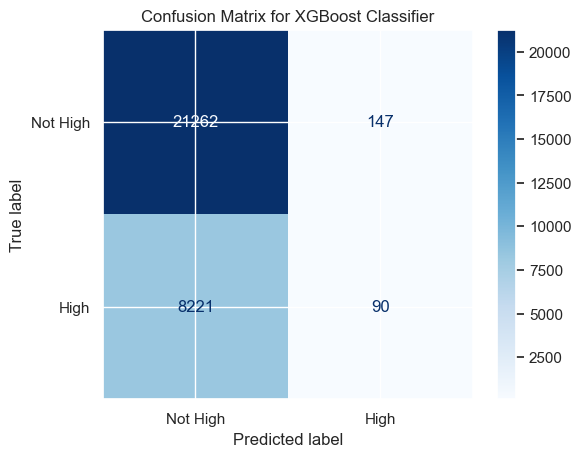

In [65]:
print("Model trained.")
print("Accuracy on training data:", best_model_2.score(df_combined_condition, y_comb))
print("Accuracy on test data:", best_model_2.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = best_model_2.predict(df_combined_condition)
arr_xgb_pred = best_model_2.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

In [66]:
results

,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_colsample_bytree,param_learning_rate,param_max_depth,param_reg_alpha,...,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score,params_str
0,0,250,8.762310,0.628463,0.377374,0.015432,0.362178,0.960714,3,0.779691,...,0.400000,1029,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,{'colsample_bytree': np.float64(0.362178083193...
1,0,250,8.743874,0.632388,0.398330,0.067592,0.169982,0.469249,1,0.601115,...,0.000000,1953,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,{'colsample_bytree': np.float64(0.169982441072...
2,0,250,7.654584,0.787640,0.388083,0.015477,0.778937,0.842443,2,0.000779,...,0.000000,1953,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,{'colsample_bytree': np.float64(0.778936896513...
3,0,250,6.873829,0.524653,0.384139,0.014236,0.528157,0.017066,1,0.291229,...,0.133333,1678,1.000000,1.000000,0.875000,1.000000,1.000000,0.975000,0.050000,{'colsample_bytree': np.float64(0.528157212341...
4,0,250,6.677844,0.308871,0.393003,0.030151,0.304501,0.376362,2,0.090606,...,0.200000,1606,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,{'colsample_bytree': np.float64(0.304501253974...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2142,9,128000,356.103100,145.701302,1.530449,0.383954,0.121781,0.749295,2,0.325104,...,0.029161,167,0.609779,0.651163,0.572285,0.456666,0.491260,0.556230,0.072487,{'colsample_bytree': np.float64(0.121780919942...
2143,9,128000,346.306154,141.722388,1.654349,0.387725,0.336112,0.951577,1,0.020934,...,0.021837,261,0.554566,0.445483,0.373531,0.410294,0.364035,0.429582,0.068824,{'colsample_bytree': np.float64(0.336111985527...
2144,9,128000,317.494354,119.462119,1.518492,0.435425,0.517026,0.411188,1,0.226656,...,0.033876,205,0.615625,0.633898,0.570312,0.440909,0.495652,0.551279,0.072944,{'colsample_bytree': np.float64(0.517025509732...
2145,10,256000,589.210928,245.028710,2.492821,0.646575,0.517026,0.411188,1,0.226656,...,0.122089,219,0.663793,0.586466,0.622642,0.442623,0.579710,0.579047,0.074498,{'colsample_bytree': np.float64(0.517025509732...


In [68]:
halving_search_2.best_params_

{'colsample_bytree': np.float64(0.12178091994215039),
 'learning_rate': np.float64(0.7492947351647732),
 'max_depth': 2,
 'reg_alpha': np.float64(0.325104015431699),
 'reg_lambda': np.float64(0.6863271966860974),
 'subsample': np.float64(0.2626770333461652)}

In [69]:
mode_redo = True

Model trained.
Accuracy on training data: 0.755604277596313
Accuracy on test data: 0.7145693135935397
For Model XGBoost: 
precision TRAIN: 0.525
% possible trades : 2.08
nb trade per day : 6.00
precision TEST: 0.327
% possible trades : 1.68
nb trade per day : 4.83


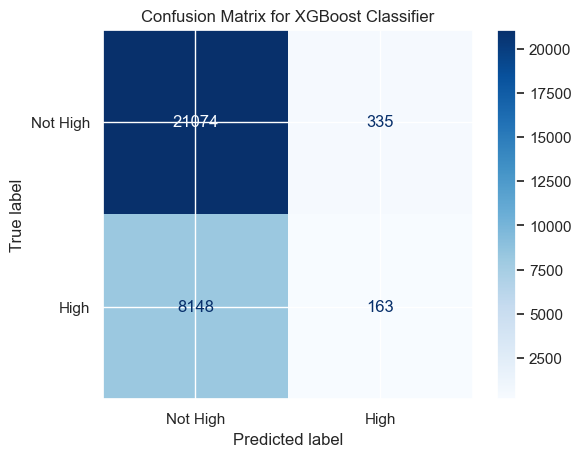

In [70]:
# {'colsample_bytree': np.float64(0.12178091994215039),
#  'learning_rate': np.float64(0.7492947351647732),
#  'max_depth': 2,
#  'reg_alpha': np.float64(0.325104015431699),
#  'reg_lambda': np.float64(0.6863271966860974),
#  'subsample': np.float64(0.2626770333461652)}
if mode_redo:
    # n 100 : 14.875
    xgb_mdl = xgb.XGBClassifier(
        verbosity=0,
        objective="binary:hinge",
        random_state=42,
        n_jobs=-1,
        #use_label_encoder=False, # Recommended to avoid a future warning
        eval_metric=fun_nb_trade_fixed_window, #fun_trades_gain, #[fun_nb_trade_fixed_window, precision_score], #, # A common metric for binary classification
        max_depth=halving_search_2.best_params_["max_depth"],
        learning_rate=halving_search_2.best_params_["learning_rate"],
        subsample=halving_search_2.best_params_["subsample"],
        colsample_bytree=halving_search_2.best_params_["colsample_bytree"],
        reg_alpha=halving_search_2.best_params_["reg_alpha"],
        reg_lambda=halving_search_2.best_params_["reg_lambda"],
        #scale_pos_weight=1.5,  # ajuster si classes déséquilibrées
        n_estimators=10000,#400+59+1,
    )
    xgb_mdl.fit(
        df_combined_condition, 
        y_comb, 
        eval_set=[(df_combined_condition_test, y_comb_test), (df_combined_condition, y_comb)],
        verbose=0,
    )
    print("Model trained.")
    # save xgb_mdl
    with open(os.path.join(path_data,'xgb_mdl_02.pkl'), 'wb') as f:
        pickle.dump(xgb_mdl, f)
else:
    # load  xgb_mdl
    xgb_mdl = pickle.load(open(os.path.join(path_data,'xgb_mdl_02.pkl'), 'rb'))
    print("Model loaded.")

print("Accuracy on training data:", xgb_mdl.score(df_combined_condition, y_comb))
print("Accuracy on test data:", xgb_mdl.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = xgb_mdl.predict(df_combined_condition)
arr_xgb_pred = xgb_mdl.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

In [71]:
arr_eval = xgb_mdl.evals_result_["validation_0"]
arr_eval_train = xgb_mdl.evals_result_["validation_1"]
arr_eval_nb_trade, arr_eval_precision = fun_decoded_nb_trade_fixed_window(np.array(arr_eval["fun_nb_trade_fixed_window"]))
arr_eval_nb_trade_train, arr_eval_precision_train = fun_decoded_nb_trade_fixed_window(
    np.array(arr_eval_train["fun_nb_trade_fixed_window"])
)
arr_eval_gain = fun_arr_trade(arr_eval_nb_trade, arr_eval_precision, risk=250, R=1.23)
arr_eval_gain_train = fun_arr_trade(arr_eval_nb_trade_train, arr_eval_precision_train, risk=250, R=1.23)

df = pd.DataFrame({
    'trades_train': arr_eval_nb_trade_train*r_period_train,
    'precision_train': arr_eval_precision_train,
    'gain_train': arr_eval_gain_train*r_period_train,
    'trades_test': arr_eval_nb_trade*r_period_test,
    'precision_test': arr_eval_precision,
    'gain_test': arr_eval_gain*r_period_test,
})
# The index is automatically available, but we can add it as a column if we want to name it.
df['run_index'] = df.index

df

,trades_train,precision_train,gain_train,trades_test,precision_test,gain_test,run_index
0,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,0
1,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,1
2,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,2
3,1.610810,0.533333,76.244723,0.000000,0.000000,-0.000000,3
4,2.835026,0.425641,-36.019412,0.581427,0.333333,-37.308318,4
...,...,...,...,...,...,...,...
9995,118.007965,0.473175,1627.927247,108.145357,0.308452,-8439.448425,9995
9996,90.849702,0.516502,3447.733943,81.109017,0.332192,-5256.104416,9996
9997,72.293167,0.538910,3646.635449,54.363392,0.348168,-3038.714624,9997
9998,104.283861,0.492068,2537.008375,90.993271,0.306630,-7193.361535,9998


In [72]:
fun_plot_pre_trade(df)

In [73]:
fun_plot_xgb_rounds(df)

### CV scoring fun_trades_gain

In [74]:
from sklearn.metrics import make_scorer
fun_score_trades_gain = make_scorer(fun_trades_gain, greater_is_better=True)

In [75]:
mode_redo = True

In [76]:
# {'colsample_bytree': np.float64(0.4633418536357893),
#  'learning_rate': np.float64(0.0776125635922149),
#  'max_depth': 1,
#  'reg_alpha': np.float64(0.06993160570943413),
#  'reg_lambda': np.float64(0.6401682238281661),
#  'subsample': np.float64(0.44403269285016633)}
if mode_redo: 
    # 'early_stopping_rounds' is not used directly with HalvingRandomSearchCV.
    xgb_mdl = xgb.XGBClassifier(
        objective="binary:hinge",
        random_state=42,
        #use_label_encoder=False, # Recommended to avoid a future warning
        #eval_metric=fun_nb_trade_fixed_window, # A common metric for binary classification
        n_estimators=1000,
    )

    # --- 4. Define the Hyperparameter Search Space ---
    param_dist = {
        'max_depth': randint(1, 4),             # Search depths from 2 to 4
        'learning_rate': uniform(0.01, 1),   # Search from 0.05 up to 0.6
        'subsample': uniform(0.2, 0.9),         # Search between 0.4 and 0.9
        'colsample_bytree': uniform(0.1, 0.7),  # Search between 0.1 and 0.6
        'reg_alpha': uniform(0.0, 1),         # Search L1 regularization
        'reg_lambda': uniform(0.0, 1),        # Search L2 regularization
        #'scale_pos_weight': uniform(1, 3),  # ajuster si classes déséquilibrées
    }

    tscv = TimeSeriesSplit(n_splits=5)

    # --- 5. Set up and Run HalvingRandomSearchCV ---
    halving_search_3 = HalvingRandomSearchCV(
        n_jobs=-1,                # Use all available CPU cores
        random_state=42,
        verbose=1,                # Set to 1 or 2 to see the progress
        cv=tscv,
        factor=2,  # Keep the top 1/3 of candidates in each iteration
        estimator=xgb_mdl,
        param_distributions=param_dist,
        #max_resources=150,        # The maximum n samples to use for the final model
        min_resources=250,#500,         # The initial n_samples to start with
        scoring=fun_score_trades_gain,       # Metric for evaluation, since hinge loss gives 0/1
    )

    print("Starting HalvingRandomSearchCV...")
    # Fit the model to the data
    halving_search_3.fit(df_combined_condition, y_comb)
    print("\nSearch complete!")

    # --- 6. Display the Results ---
    print("\n--- Cross-Validation Results ---")
    print(f"Best Score (Accuracy): {halving_search_3.best_score_:.4f}")
    print("\nBest Parameters Found:")
    # Using a loop for cleaner printing
    for param, value in halving_search_3.best_params_.items():
        if isinstance(value, float):
            print(f"  {param}: {value:.4f}")
        else:
            print(f"  {param}: {value}")
    # save halving_search
    with open(os.path.join(path_data,'xgb_halving_search_03.pkl'), 'wb') as f:
        pickle.dump(halving_search_3, f)
else:
    # load  halving_search
    halving_search_3 = pickle.load(open(os.path.join(path_data,'xgb_halving_search_03.pkl'), 'rb'))
# The best_estimator_ is a fully trained model on the entire dataset
# using the best parameters found.
best_model_3 = halving_search_3.best_estimator_
print("\nBest model is now trained and ready to be used for predictions.")

Starting HalvingRandomSearchCV...
n_iterations: 11
n_required_iterations: 11
n_possible_iterations: 11
min_resources_: 250
max_resources_: 268188
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 1072
n_resources: 250
Fitting 5 folds for each of 1072 candidates, totalling 5360 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:516: FitFailedWarning:


580 fits failed out of a total of 5360.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fi

----------
iter: 1
n_candidates: 536
n_resources: 500
Fitting 5 folds for each of 536 candidates, totalling 2680 fits
----------
iter: 2
n_candidates: 268
n_resources: 1000
Fitting 5 folds for each of 268 candidates, totalling 1340 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [-300.         -250.         -350.         ... -416.83333333 -341.16666667
 -689.38888889]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1783.5        1783.5        1783.5        ... 3444.         1887.01190476
 3444.        ]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [-300.         -250.         -350.         ... -996.09532164 -782.00505051
 -825.38      ]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1783.5        1783.5        1783.

----------
iter: 3
n_candidates: 134
n_resources: 2000
Fitting 5 folds for each of 134 candidates, totalling 670 fits
----------
iter: 4
n_candidates: 67
n_resources: 4000
Fitting 5 folds for each of 67 candidates, totalling 335 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [-300.         -250.         -350.         ... -327.15625    -368.22649573
 -347.47285068]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1783.5        1783.5        1783.5        ... 5065.7818875  4897.49001536
 5992.20454545]



----------
iter: 5
n_candidates: 34
n_resources: 8000
Fitting 5 folds for each of 34 candidates, totalling 170 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [-300.         -250.         -350.         ...  -22.17857143  114.0952381
   46.68831169]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1783.5        1783.5        1783.5        ... 4231.47204969 4704.99464286
 2898.        ]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [-300.         -250.         -350.         ... -840.30494505 -752.97826087
 -880.92592593]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1783.5        1783.5        1783.5

----------
iter: 6
n_candidates: 17
n_resources: 16000
Fitting 5 folds for each of 17 candidates, totalling 85 fits
----------
iter: 7
n_candidates: 9
n_resources: 32000
Fitting 5 folds for each of 9 candidates, totalling 45 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [-300.  -250.  -350.  ...   46.   184.5   61.5]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1783.5        1783.5        1783.5        ... 3818.27777778  515.
  307.5       ]



----------
iter: 8
n_candidates: 5
n_resources: 64000
Fitting 5 folds for each of 5 candidates, totalling 25 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [-300.  -250.  -350.  ...   61.5 -238.5 -315.5]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1783.5 1783.5 1783.5 ...    0.   196.   945.5]



----------
iter: 9
n_candidates: 3
n_resources: 128000
Fitting 5 folds for each of 3 candidates, totalling 15 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [-300.  -250.  -350.  ...    0.     0.   380.5]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1783.5 1783.5 1783.5 ...    0.     0.   907. ]



----------
iter: 10
n_candidates: 2
n_resources: 256000
Fitting 5 folds for each of 2 candidates, totalling 10 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the test scores are non-finite: [-300. -250. -350. ...    0.    0.    0.]

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning:

One or more of the train scores are non-finite: [1783.5 1783.5 1783.5 ...    0.     0.     0. ]




Search complete!

--- Cross-Validation Results ---
Best Score (Accuracy): 0.0000

Best Parameters Found:
  colsample_bytree: 0.7444
  learning_rate: 0.0220
  max_depth: 1
  reg_alpha: 0.6235
  reg_lambda: 0.0631
  subsample: 0.4921

Best model is now trained and ready to be used for predictions.


In [77]:
halving_search_3.best_params_

{'colsample_bytree': np.float64(0.7443751195717883),
 'learning_rate': np.float64(0.022003027272682545),
 'max_depth': 1,
 'reg_alpha': np.float64(0.6235191951741544),
 'reg_lambda': np.float64(0.06310636911554623),
 'subsample': np.float64(0.4921482516591454)}

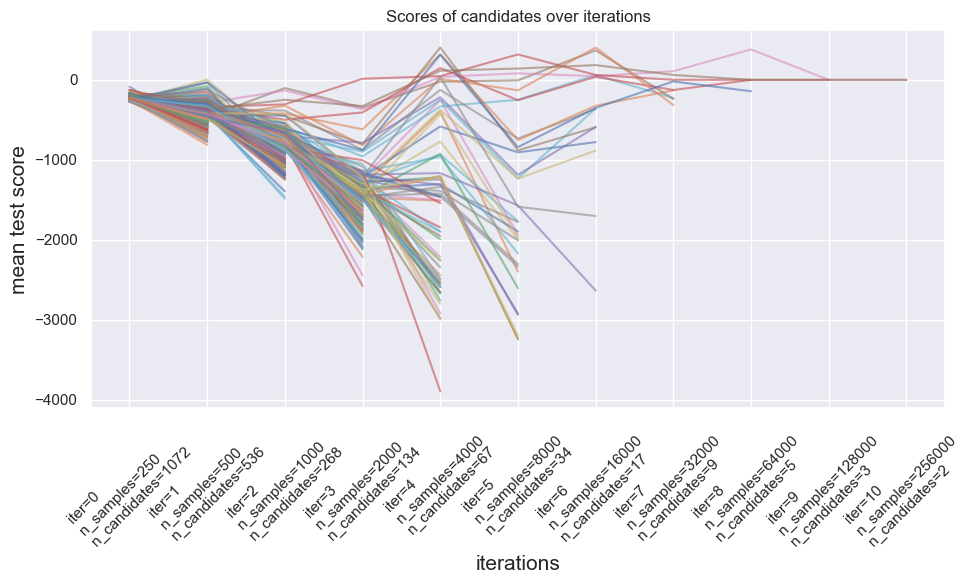

In [ ]:
# --- Cross-Validation Results ---
# Best Score (Accuracy): 0.0000

# {'colsample_bytree': np.float64(0.7443751195717883),
#  'learning_rate': np.float64(0.022003027272682545),
#  'max_depth': 1,
#  'reg_alpha': np.float64(0.6235191951741544),
#  'reg_lambda': np.float64(0.06310636911554623),
#  'subsample': np.float64(0.4921482516591454)}

results = pd.DataFrame(halving_search_3.cv_results_)
results["params_str"] = results.params.apply(str)
results.drop_duplicates(subset=("params_str", "iter"), inplace=True)
mean_scores = results.pivot(
    index="iter", columns="params_str", values="mean_test_score"
)
ax = mean_scores.plot(legend=False, alpha=0.6)

labels = [
    f"iter={i}\nn_samples={halving_search_3.n_resources_[i]}\nn_candidates={halving_search_3.n_candidates_[i]}"
    for i in range(halving_search_2.n_iterations_)
]

ax.set_xticks(range(halving_search_3.n_iterations_))
ax.set_xticklabels(labels, rotation=45, multialignment="left")
ax.set_title("Scores of candidates over iterations")
ax.set_ylabel("mean test score", fontsize=15)
ax.set_xlabel("iterations", fontsize=15)
plt.gcf().set_size_inches((10, 6))
plt.tight_layout()
plt.show()

Model trained.
Accuracy on training data: 0.7545490476829687
Accuracy on test data: 0.7203566621803499
For Model XGBoost: 
precision TRAIN: 0.000
% possible trades : 0.00
nb trade per day : 0.00
precision TEST: 0.000
% possible trades : 0.00
nb trade per day : 0.00


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



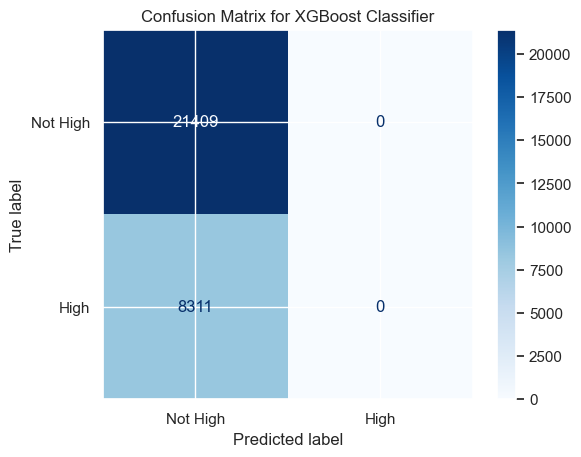

In [79]:
print("Model trained.")
print("Accuracy on training data:", best_model_3.score(df_combined_condition, y_comb))
print("Accuracy on test data:", best_model_3.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = best_model_3.predict(df_combined_condition)
arr_xgb_pred = best_model_3.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

In [80]:
results

,iter,n_resources,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_colsample_bytree,param_learning_rate,param_max_depth,param_reg_alpha,...,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score,params_str
0,0,250,7.495746,0.463490,0.319316,0.031957,0.362178,0.960714,3,0.779691,...,400.000000,801,307.5,615.0,1845.000,2460.0,3690.0,1783.500,1236.134701,{'colsample_bytree': np.float64(0.362178083193...
1,0,250,7.512894,0.581132,0.319472,0.046355,0.169982,0.469249,1,0.601115,...,387.298335,495,307.5,615.0,1845.000,2460.0,3690.0,1783.500,1236.134701,{'colsample_bytree': np.float64(0.169982441072...
2,0,250,6.635143,0.541660,0.336251,0.042601,0.778937,0.842443,2,0.000779,...,374.165739,1013,307.5,615.0,1845.000,2460.0,3690.0,1783.500,1236.134701,{'colsample_bytree': np.float64(0.778936896513...
3,0,250,5.816269,0.370985,0.354810,0.019989,0.528157,0.017066,1,0.291229,...,193.653757,44,307.5,615.0,1426.875,1845.0,3075.0,1453.875,979.759250,{'colsample_bytree': np.float64(0.528157212341...
4,0,250,5.745239,0.439959,0.354617,0.016634,0.304501,0.376362,2,0.090606,...,406.360677,85,307.5,615.0,1845.000,2460.0,3690.0,1783.500,1236.134701,{'colsample_bytree': np.float64(0.304501253974...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2142,9,128000,351.555426,146.698217,1.773402,0.281471,0.528157,0.017066,1,0.291229,...,0.000000,25,0.0,0.0,0.000,0.0,0.0,0.000,0.000000,{'colsample_bytree': np.float64(0.528157212341...
2143,9,128000,350.110487,146.755648,1.758356,0.345787,0.744375,0.022003,1,0.623519,...,0.000000,25,0.0,0.0,0.000,0.0,0.0,0.000,0.000000,{'colsample_bytree': np.float64(0.744375119571...
2144,9,128000,334.169662,126.252253,1.476279,0.408245,0.253744,0.010227,2,0.843879,...,0.000000,25,0.0,0.0,0.000,0.0,0.0,0.000,0.000000,{'colsample_bytree': np.float64(0.253744450016...
2145,10,256000,624.118847,259.146066,2.635771,0.725037,0.744375,0.022003,1,0.623519,...,0.000000,25,0.0,0.0,0.000,0.0,0.0,0.000,0.000000,{'colsample_bytree': np.float64(0.744375119571...


In [81]:
mode_redo = True

Model trained.
Accuracy on training data: 0.7545490476829687
Accuracy on test data: 0.7203566621803499
For Model XGBoost: 
precision TRAIN: 0.000
% possible trades : 0.00
nb trade per day : 0.00
precision TEST: 0.000
% possible trades : 0.00
nb trade per day : 0.00


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



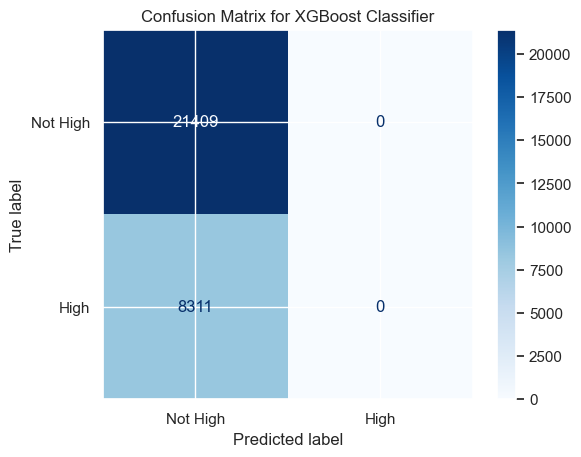

In [82]:

if mode_redo:
    # n 100 : 14.875
    xgb_mdl = xgb.XGBClassifier(
        verbosity=0,
        objective="binary:hinge",
        random_state=42,
        n_jobs=-1,
        #use_label_encoder=False, # Recommended to avoid a future warning
        eval_metric=fun_nb_trade_fixed_window, #fun_trades_gain, #[fun_nb_trade_fixed_window, precision_score], #, # A common metric for binary classification
        max_depth=halving_search_3.best_params_["max_depth"],
        learning_rate=halving_search_3.best_params_["learning_rate"],
        subsample=halving_search_3.best_params_["subsample"],
        colsample_bytree=halving_search_3.best_params_["colsample_bytree"],
        reg_alpha=halving_search_3.best_params_["reg_alpha"],
        reg_lambda=halving_search_3.best_params_["reg_lambda"],
        #scale_pos_weight=1.5,  # ajuster si classes déséquilibrées
        n_estimators=10000,#400+59+1,
    )
    xgb_mdl.fit(
        df_combined_condition, 
        y_comb, 
        eval_set=[(df_combined_condition_test, y_comb_test), (df_combined_condition, y_comb)],
        verbose=0,
    )
    print("Model trained.")
    # save xgb_mdl
    with open(os.path.join(path_data,'xgb_mdl_03.pkl'), 'wb') as f:
        pickle.dump(xgb_mdl, f)
else:
    # load  xgb_mdl
    xgb_mdl = pickle.load(open(os.path.join(path_data,'xgb_mdl_03.pkl'), 'rb'))
    print("Model loaded.")

print("Accuracy on training data:", xgb_mdl.score(df_combined_condition, y_comb))
print("Accuracy on test data:", xgb_mdl.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = xgb_mdl.predict(df_combined_condition)
arr_xgb_pred = xgb_mdl.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

In [83]:
arr_eval = xgb_mdl.evals_result_["validation_0"]
arr_eval_train = xgb_mdl.evals_result_["validation_1"]
arr_eval_nb_trade, arr_eval_precision = fun_decoded_nb_trade_fixed_window(np.array(arr_eval["fun_nb_trade_fixed_window"]))
arr_eval_nb_trade_train, arr_eval_precision_train = fun_decoded_nb_trade_fixed_window(
    np.array(arr_eval_train["fun_nb_trade_fixed_window"])
)
arr_eval_gain = fun_arr_trade(arr_eval_nb_trade, arr_eval_precision, risk=250, R=1.23)
arr_eval_gain_train = fun_arr_trade(arr_eval_nb_trade_train, arr_eval_precision_train, risk=250, R=1.23)

df = pd.DataFrame({
    'trades_train': arr_eval_nb_trade_train*r_period_train,
    'precision_train': arr_eval_precision_train,
    'gain_train': arr_eval_gain_train*r_period_train,
    'trades_test': arr_eval_nb_trade*r_period_test,
    'precision_test': arr_eval_precision,
    'gain_test': arr_eval_gain*r_period_test,
})
# The index is automatically available, but we can add it as a column if we want to name it.
df['run_index'] = df.index

df

,trades_train,precision_train,gain_train,trades_test,precision_test,gain_test,run_index
0,0.0,0.0,-0.0,0.0,0.0,-0.0,0
1,0.0,0.0,-0.0,0.0,0.0,-0.0,1
2,0.0,0.0,-0.0,0.0,0.0,-0.0,2
3,0.0,0.0,-0.0,0.0,0.0,-0.0,3
4,0.0,0.0,-0.0,0.0,0.0,-0.0,4
...,...,...,...,...,...,...,...
9995,0.0,0.0,-0.0,0.0,0.0,-0.0,9995
9996,0.0,0.0,-0.0,0.0,0.0,-0.0,9996
9997,0.0,0.0,-0.0,0.0,0.0,-0.0,9997
9998,0.0,0.0,-0.0,0.0,0.0,-0.0,9998


In [84]:
fun_plot_pre_trade(df)

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_56276/2535082174.py:9: RuntimeWarning:

divide by zero encountered in divide



In [85]:
fun_plot_xgb_rounds(df)